<h1>Содержание<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Предобработка-данных" data-toc-modified-id="Предобработка-данных-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Предобработка данных</a></span><ul class="toc-item"><li><span><a href="#Обработка-пропусков" data-toc-modified-id="Обработка-пропусков-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Обработка пропусков</a></span></li></ul></li><li><span><a href="#Исследовательский-анализ-данных" data-toc-modified-id="Исследовательский-анализ-данных-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Исследовательский анализ данных</a></span><ul class="toc-item"><li><span><a href="#Категории-заведений" data-toc-modified-id="Категории-заведений-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Категории заведений</a></span></li><li><span><a href="#Сравнение-сетевых-и-несетевых-заведений" data-toc-modified-id="Сравнение-сетевых-и-несетевых-заведений-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Сравнение сетевых и несетевых заведений</a></span></li><li><span><a href="#Топ-15-сетей-общественного-питания-Москвы" data-toc-modified-id="Топ-15-сетей-общественного-питания-Москвы-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Топ-15 сетей общественного питания Москвы</a></span></li><li><span><a href="#Исследование-административных-округов-Москвы" data-toc-modified-id="Исследование-административных-округов-Москвы-2.4"><span class="toc-item-num">2.4&nbsp;&nbsp;</span>Исследование административных округов Москвы</a></span></li><li><span><a href="#Рейтинги-заведений" data-toc-modified-id="Рейтинги-заведений-2.5"><span class="toc-item-num">2.5&nbsp;&nbsp;</span>Рейтинги заведений</a></span></li><li><span><a href="#Анализ-местоположения" data-toc-modified-id="Анализ-местоположения-2.6"><span class="toc-item-num">2.6&nbsp;&nbsp;</span>Анализ местоположения</a></span></li><li><span><a href="#Средний-чек" data-toc-modified-id="Средний-чек-2.7"><span class="toc-item-num">2.7&nbsp;&nbsp;</span>Средний чек</a></span></li></ul></li><li><span><a href="#Анализ-рынка-кофеен-Москвы" data-toc-modified-id="Анализ-рынка-кофеен-Москвы-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Анализ рынка кофеен Москвы</a></span></li></ul></div>

# Исследование рынка заведений общественного питания Москвы

Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

Задачи: 

- Изучить и предобработать данные;
- Исследовать заведения общественного питания Москвы и их показатели;
- Провести гео-аналитику;
- Визуализировать данные;
- Изучить рынок кофеен и дать рекомендации об открытии нового заведения.



In [1]:
# загрузим все необходимые для проекта библиотеки

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go 
import numpy as np

# импортируем карту и хороплет
!pip install folium
from folium import Map, Choropleth

In [2]:
# загрузим данные в переменную df

df = pd.read_csv('C:\\Users\\User\\Desktop\\Python\\moscow_places.csv')

In [3]:
# выведем первые пять строк датафрейма на экран

df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


## Предобработка данных

In [4]:
# изучим информацию о датафрейме

df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Всего в датафрейме 8406 строк.


Типы данных указаны верно. Столбцы с категориальными значениями имеют тип object, столбцы с количественными значениям - тип float64.

Заменим пропущенные значениям столбца seats на 0:

In [5]:
df['seats'] = df['seats'].fillna(0)

Изменим тип данных столбца seats на int:

In [6]:
df['seats'] = df['seats'].astype('int64')

Посчитаем число точек общепита в датафрейме:

In [7]:
print('В датафрейме представлено', df['name'].count(),'заведений.')

В датафрейме представлено 8406 заведений.


___

Изучим, есть ли дубликаты в данных и поищем пропуски.

In [8]:
# посчитаем число явных дубликатов в датафрейме

df.duplicated().sum()

0

Полных явных дубликатов в датафрейме нет.

In [9]:
# посмотрим число дубликатов в столбце с названиями заведений

df['name'].duplicated().sum()

2792

В столбце name 2790 дубликатов. Это объясняется наличием в датасете сетевых заведений с одинаковыми названиями. 
___ 

Изучим уникальные значения столбцов с категориальными данными. Проверим их на неявные дубликаты

In [10]:
# изучим уникальные значения столбца district

df['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Неявных дубликатов в столбце district не выявлено. 

Изучим уникальные значения столбца category:

In [11]:
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

Неявных дубликатов в столбце category нет.

Изучим уникальные значения столбца price:

In [12]:
df['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

Неявных дубликатов в столбце price нет.

### Обработка пропусков 

In [13]:
# изучим пропуски в датафрейме

pd.DataFrame(round(df.isna().mean()*100,1)).style.background_gradient('coolwarm')

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.400000
lat,0.000000
lng,0.000000
rating,0.000000
price,60.600000
avg_bill,54.600000


- Больше всего пропусков (93,6%) - в столбце middle_coffee_cup среднюю оценку одной чашки капучино.

- Также пропуски есть в столбцах price (60,6% пропусков), avg_bill(54,6%), middle_avg_bill (62.5%) и seats (43%).

**Изучение столбца middle_avg_bill**

Изучим статистические показатели значений в столбце middle_avg_bill

In [14]:
df[df['middle_avg_bill'] > 0]['middle_avg_bill'].describe()

count     3148.000000
mean       958.358005
std       1009.748800
min         30.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64

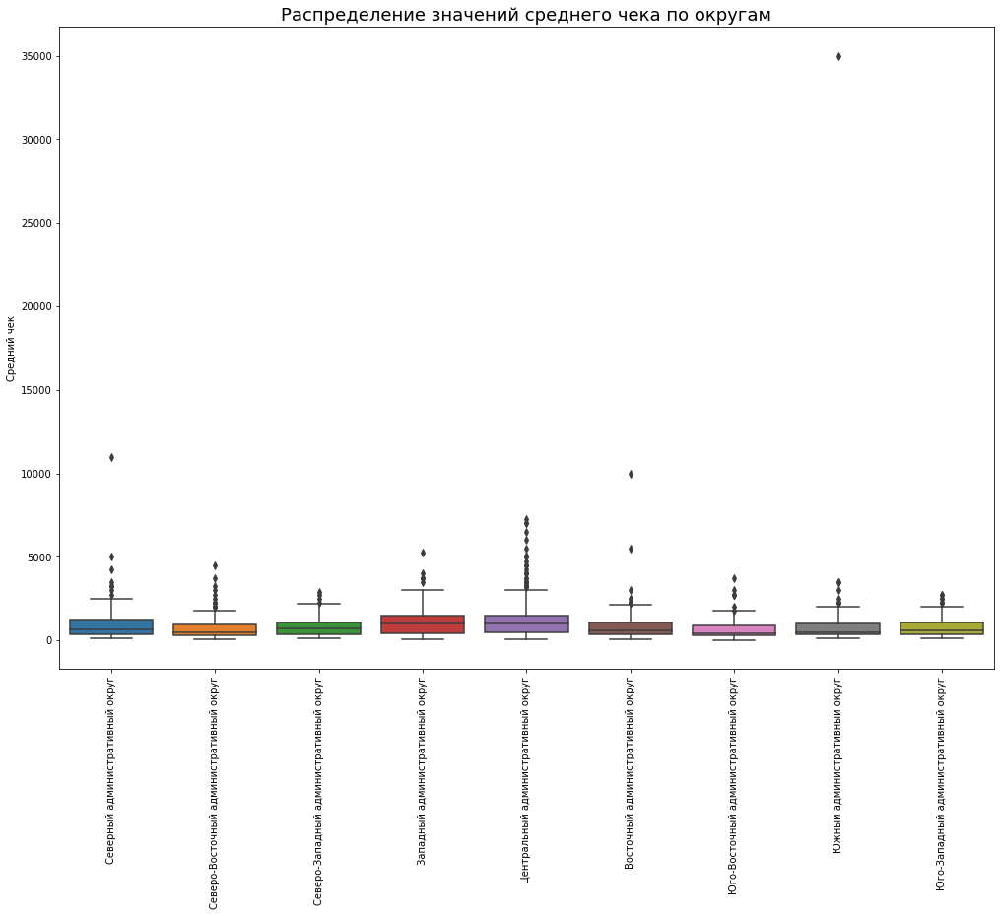

In [15]:
# посмтроим диаграммы "ящик с усами" для всех округов

plt.figure(figsize=(17,12))
sns.boxplot(x='district', y= 'middle_avg_bill', data=df[df['middle_avg_bill'] > 0])
plt.title('Распределение значений среднего чека по округам', fontsize=18)
plt.xlabel('')
plt.ylabel('Средний чек')
plt.xticks(rotation = 90)
plt.show()

В значения среднего чека есть несколько аномальных выбросов. Средний чек в некоторых заведениях составляет более 10 тыс. рублей.

In [16]:
# вывыедем 90,95 и 99 процентили

Изучим заведения, в которых средний чек превышает 99,9-й процентиль:


In [17]:
np.percentile(df[df['middle_avg_bill'] > 0]['middle_avg_bill'], 99.9)

7213.25000000013

Только 0,1 процент заведений имеет средний чек выше 7213 рублей.

In [18]:
# найдем заведения, чей средний чек выше 7000 рублей.

df[df['middle_avg_bill'] > 7000]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
730,Чойхона,"бар,паб","Москва, Дмитровское шоссе, 95А",Северный административный округ,"ежедневно, 10:00–23:00",55.871497,37.543555,4.4,высокие,Средний счёт:5000–17000 ₽,11000.0,NaN,0,49
3882,White Rabbit,ресторан,"Москва, Смоленская площадь, 3",Центральный административный округ,"ежедневно, 12:00–00:00",55.747608,37.581248,4.9,высокие,Средний счёт:7000–7500 ₽,7250.0,NaN,0,150
5481,Гости,ресторан,"Москва, шоссе Энтузиастов, 52",Восточный административный округ,"пн,вс 18:00–22:30",55.759088,37.760570,4.1,высокие,Средний счёт:5000–15000 ₽,10000.0,NaN,0,0
7177,Кафе,ресторан,"Москва, Каширское шоссе, 23, стр. 2",Южный административный округ,"ежедневно, круглосуточно",55.657450,37.646665,4.1,высокие,Средний счёт:20000–50000 ₽,35000.0,NaN,0,100


Ресторан White Rabbit - одно из самых дорогих и известных в России заведений. Поэтому в его случае средний чек в 7250 рублей вполне объясним.

Остальные аномальные значения скорее всего ошибочны. 

In [19]:
# посчитаем медиану среднего чека для рахных округов


for district in df['district'].unique(): 
    avg_bill_district = df[(df['district'] == district) & (df['middle_avg_bill'] > 0)]['middle_avg_bill'].median()
    print(f'Средний чек в {district} составляет {avg_bill_district} рублей')

Средний чек в Северный административный округ составляет 650.0 рублей
Средний чек в Северо-Восточный административный округ составляет 500.0 рублей
Средний чек в Северо-Западный административный округ составляет 700.0 рублей
Средний чек в Западный административный округ составляет 1000.0 рублей
Средний чек в Центральный административный округ составляет 1000.0 рублей
Средний чек в Восточный административный округ составляет 575.0 рублей
Средний чек в Юго-Восточный административный округ составляет 450.0 рублей
Средний чек в Южный административный округ составляет 500.0 рублей
Средний чек в Юго-Западный административный округ составляет 600.0 рублей


Построим гистограммы распределений среднего чека по округам.

In [20]:
districts = df['district'].unique()

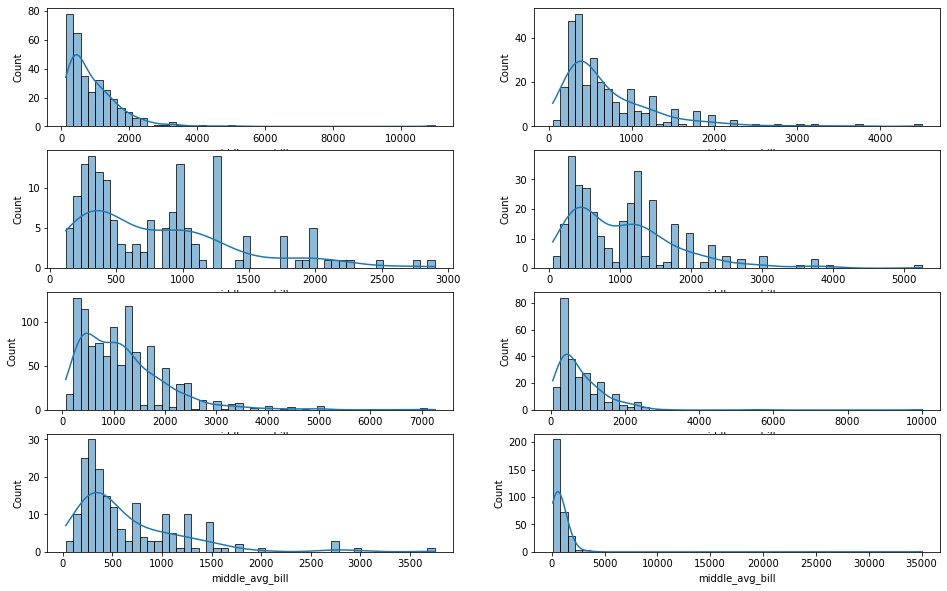

In [21]:
fig, axs = plt.subplots(4, 2, figsize=(16, 10))


for i, j in enumerate(range(0, len(districts[:8]), 2)):


    sns.histplot(
        df[(df['district'] == districts[j]) & 
           (df['middle_avg_bill'] > 0)]['middle_avg_bill'], 
        kde=True, 
        bins=50,
        ax=axs[i, 0]
    )
    sns.histplot(
        df[(df['district'] == districts[j + 1]) & 
           (df['middle_avg_bill'] > 0)]['middle_avg_bill'], 
        kde=True, 
        bins=50,
        ax=axs[i, 1]
    )
    
plt.show()

Распределение цен по всему округам имеет длинный хвост. Это означает наличие определенного числа дорогостоящих заведений в каждом из них.

Заменим пропуски в столбце middle_avg_bill на 0, так как все имеющиеся показатели индивидуальны для каждого заведения, а заполнение пропусков, например, по медиане, может исказить имеющиеся статистики:


In [22]:
df['middle_avg_bill'] = df['middle_avg_bill'].fillna(0)

In [23]:
# изменим тип данных столбца middle_avg_bill на int

df['middle_avg_bill'] = df['middle_avg_bill'].astype('int64')


In [24]:
# перезапишем датафрейм, установив порог значений столбца middle_avg_bill в 7250 рублей.

df = df[df['middle_avg_bill'] <= 7250].reset_index(drop=True)

**Изучение столбца price**

In [25]:
# выведем уникальные значения столбца price на экран

df['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

In [26]:
# Заменим пропуски на категорию "категория не указана"

df['price'] = df['price'].fillna('категория не указана')

В столбце каждому заведению присвоены категории цен: «средние», «ниже среднего», «выше среднего». 

Выясним минимальные и максимальные показатели чека по каждой категории:

In [27]:
# посчитаем минимальный и максимальный чек для категорий столбца price

for cat in df['price'].unique():
    min = df[(df['price'] == cat) & (df['middle_avg_bill'] > 0)]['middle_avg_bill'].min()
    max = df[(df['price'] == cat) & (df['middle_avg_bill'] > 0)]['middle_avg_bill'].max()
    
    print(f'Минимальная цена категории {cat}:{min} рублей.')
    print(f'Максимальная цена категории {cat}: {max} рублей.')
    print()

Минимальная цена категории категория не указана:30 рублей.
Максимальная цена категории категория не указана: 4000 рублей.

Минимальная цена категории выше среднего:375 рублей.
Максимальная цена категории выше среднего: 4500 рублей.

Минимальная цена категории средние:165 рублей.
Максимальная цена категории средние: 2150 рублей.

Минимальная цена категории высокие:950 рублей.
Максимальная цена категории высокие: 7250 рублей.

Минимальная цена категории низкие:90 рублей.
Максимальная цена категории низкие: 600 рублей.



**Изучение столбца middle_coffee_cup**

Столбец middle_coffee_cup отражает среднюю стоимость капучино и имеет тип float.

В столбце заполнены только 6,4% ячеек.

Заменим пропуски в столбце на 0:

In [28]:
df['middle_coffee_cup'] = df['middle_coffee_cup'].fillna(0)

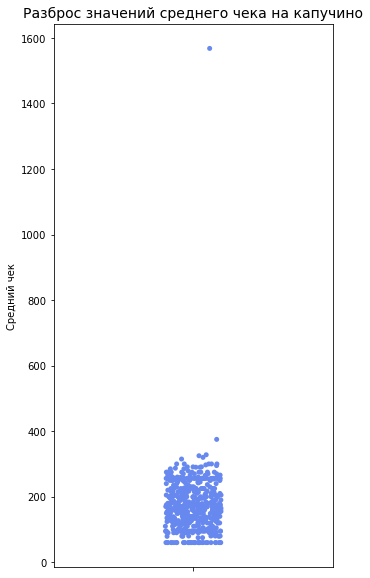

In [29]:
# посмтроим диаграмму "график-полоску" для имеющихся значений

plt.figure(figsize=(5,10))
sns.set_palette('coolwarm')
sns.stripplot(y='middle_coffee_cup', data=df[df['middle_coffee_cup'] > 0])
plt.title('Разброс значений среднего чека на капучино', fontsize=14)
plt.xlabel('')
plt.ylabel('Средний чек')
plt.show()

На диаграмме мы видим одну аномалию: в одном из заведений средний чек на капучино составляет почти 1600 рублей. 

Ограничим значения столбца middle_coffee_cup показателем в 400 рублей:

In [30]:
df = df[df['middle_coffee_cup'] <= 400].reset_index(drop=True)

**Изучение столбца seats**

In [31]:
# выведем опистаельные статистики столбца seats

In [32]:
df[df['seats'] > 0]['seats'].describe()

count    4656.000000
mean      111.616194
std       123.220827
min         1.000000
25%        40.000000
50%        79.000000
75%       143.000000
max      1288.000000
Name: seats, dtype: float64

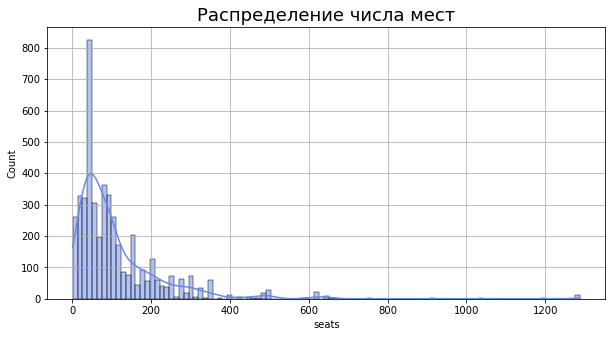

In [33]:
# построим гистограмму числа мест

plt.figure(figsize=(10,5))
sns.set_palette('coolwarm')
sns.histplot(df[df['seats'] > 0]['seats'], kde=True)
plt.grid()
plt.title('Распределение числа мест', fontsize=18)
plt.show()

Большая часть значений числа мест сконцетрирована вокруг показателя 80. Гистограмма имеет очень длинный хвост.

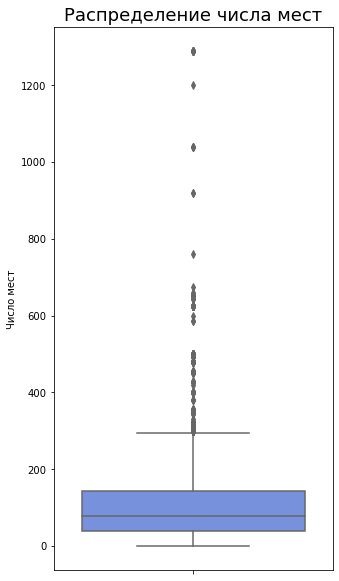

In [34]:
# построим "ящик с усами" по значениям числа мест 

plt.figure(figsize=(5,10))
sns.set_palette('coolwarm')
sns.boxplot(y= 'seats', data=df[df['seats'] > 0])
plt.title('Распределение числа мест', fontsize=18)
plt.xlabel('')
plt.ylabel('Число мест')
plt.show()

В столбце seats много выбросов. Есть заведения с числом мест более 1 тыс.

Посмотрим, что это за заведения:



In [35]:
df[df['seats'] > 1000]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2712,Ваня и Гоги,"бар,паб","Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,"ежедневно, 11:00–06:00",55.789842,37.750282,4.2,высокие,Средний счёт:1000–2500 ₽,1750,0.0,0,1040
2721,Маргарита,быстрое питание,"Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,"ежедневно, 10:00–22:00",55.789527,37.752004,4.3,категория не указана,NaN,0,0.0,1,1040
2769,Шоколадница,кофейня,"Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,"пн-ср 11:00–23:00; чт 11:00–00:00; пт,сб 11:00...",55.789903,37.749822,4.1,категория не указана,NaN,0,0.0,1,1040
2964,Матрешка,кафе,"Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,NaN,55.789867,37.749656,4.0,категория не указана,NaN,0,0.0,0,1040
4229,РестоБар Argomento,столовая,"Москва, Кутузовский проспект, 41, стр. 1",Западный административный округ,"ежедневно, 12:00–23:00",55.738237,37.531819,4.2,высокие,Средний счёт:2500–5000 ₽,3750,0.0,0,1200
6515,DelonixCafe,ресторан,"Москва, проспект Вернадского, 94, корп. 1",Западный административный округ,"ежедневно, круглосуточно",55.652577,37.475730,4.1,высокие,Средний счёт:1500–2000 ₽,1750,0.0,0,1288
6521,Ян Примус,ресторан,"Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00...",55.657166,37.481519,4.5,выше среднего,Средний счёт:1500 ₽,1500,0.0,1,1288
6571,Мюнгер,пиццерия,"Москва, проспект Вернадского, 97, корп. 1",Западный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–21:00",55.667505,37.491001,4.8,категория не указана,NaN,0,0.0,1,1288
6638,One Price Coffee,кофейня,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,"ежедневно, 08:30–20:00",55.665129,37.478635,4.3,категория не указана,NaN,0,0.0,1,1288
6655,ГудБар,"бар,паб","Москва, проспект Вернадского, 97, корп. 1",Западный административный округ,"пн-пт 11:00–23:00; сб,вс 13:00–23:00",55.667327,37.490601,4.1,средние,Средний счёт:700 ₽,700,0.0,0,1288


Большие значения в столбце seats указаны у заведений, которые работают в рамках фудкортов торговых центров. 

Например, у заведений "Ваня и Гоги", "Маргарита", "Шоколадница" и "Матрешка" указано одно и то же количество мест - 1040. Все они работают по одному адресу: Измайловское шоссе, 71А, где расположен ТЦ "Измайловский Пассаж".

**Анализ столбцов avg_bill и hours**	

В столбце avg_bill выявлено почти 55% пропусков, однако данные в нем указаны в строком формате и для дальнейшего анализа не пригодятся. 

В столбце hours, в котором мы нашли 6% пропусков, данные также указаны в формате строки. Пропуски в нем можно не заполнять, так как они не повлияют на дальнеший анализ. 
___

Cоздадим столбец street с названиями улиц из столбца с адресом:


In [36]:
df['street'] = df['address'].str.split(', ').str[1]

In [37]:
# проверим работу кода по созданию нового столбца

df[['address','street']].sample(10)

,address,street
3724,"Москва, улица Новый Арбат, 21, стр. 1",улица Новый Арбат
4637,"Москва, Кривоколенный переулок, 12с10",Кривоколенный переулок
6007,"Москва, Севастопольский проспект, 11Е",Севастопольский проспект
2136,"Москва, проспект Мира, 28 с1",проспект Мира
2185,"Москва, Ярославская улица, 8к4",Ярославская улица
3984,"Москва, Колымажный переулок, 8/4с7",Колымажный переулок
3149,"Москва, Береговой проезд, 5, стр. 1",Береговой проезд
7353,"Москва, Белореченская улица, 30, стр. 2",Белореченская улица
2695,"Москва, Уральская улица, 1А",Уральская улица
171,"Москва, Дмитровское шоссе, 163А, корп. 1",Дмитровское шоссе


Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
- логическое значение True — если заведение работает ежедневно и круглосуточно;
- логическое значение False — в противоположном случае.

In [38]:
# создадим столбец is_24/7, используя lambda функцию

df['is_24/7'] = df['hours'].apply(lambda x: True if x == 'ежедневно, круглосуточно' else False)

In [39]:
# проверим корректность отображения нового столбца is_24/7

df[['hours', 'is_24/7']].sample(10)

,hours,is_24/7
8133,"пн-пт 08:00–21:00; сб,вс 10:00–21:00",False
2675,"ежедневно, 06:00–02:00",False
6414,"ежедневно, круглосуточно",True
7239,"ежедневно, 09:00–22:00",False
2538,"ежедневно, круглосуточно",True
6162,"ежедневно, круглосуточно",True
4661,пн-пт 09:00–17:00,False
3091,"ежедневно, 10:00–22:00",False
5155,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",False
1060,"пн-пт 07:00–23:00; сб,вс 09:00–23:00",False


Итог:

В ходе предобработки данных мы:

- Посмотрели число явных и неявных дубликатов. Нашли более 2,7 тыс явных дубликатов в столбце с названием заведения, но удалять их не стали, так как они принадлежат заведениям сетей. 
- Изучили уникальные значения других столбцов с категориальными значениями. Неявных дубликатов не нашли.
- Проанализировали и обработали пропуски в столбцах. В столбцах, значения которых могут понадобится для дальнейшего анализа, заменили пропуски на значение 0. 
- Проанализировали выбросы столбцов со средним чеком, средней стоимостью капучино и числом мест:
  - ограничили значения столбца со стоимостью капучино показателем в 400 рублей;
  - выяснили, что аномально большие значения в столбце seats указаны у заведений, которые работают в рамках фудкортов торговых центров;
  - установили порог значений столбца со средним чеком в 7250 рублей, так как значения выше явно указаны ошибочно.
- Рассчитали границы ценовых категорий столбца price;
- Добавили столбцы с улицей заведения и с обозначением, что заведение работает ежедневно и круглосуточно.


## Исследовательский анализ данных

### Категории заведений

In [40]:
# посчитаем общее число заведений в Москве

count_total = len(df)

print(f'Всего в Москве {count_total} заведений общественного питания.')


Всего в Москве 8402 заведений общественного питания.


Исследуем количество объектов общественного питания по категориям.

In [41]:
# создадим датасет числа заведений по каждой категории

df_category = df.groupby('category').agg({'name':'count'}).sort_values('name', ascending=False).reset_index()
df_category = df_category.rename(columns={'name':'count'})
df_category['share,%'] = round(df_category['count'] / df_category['count'].sum()*100,2)

df_category

,category,count,"share,%"
0,кафе,2378,28.30
1,ресторан,2041,24.29
2,кофейня,1412,16.81
3,"бар,паб",764,9.09
4,пиццерия,633,7.53
5,быстрое питание,603,7.18
6,столовая,315,3.75
7,булочная,256,3.05


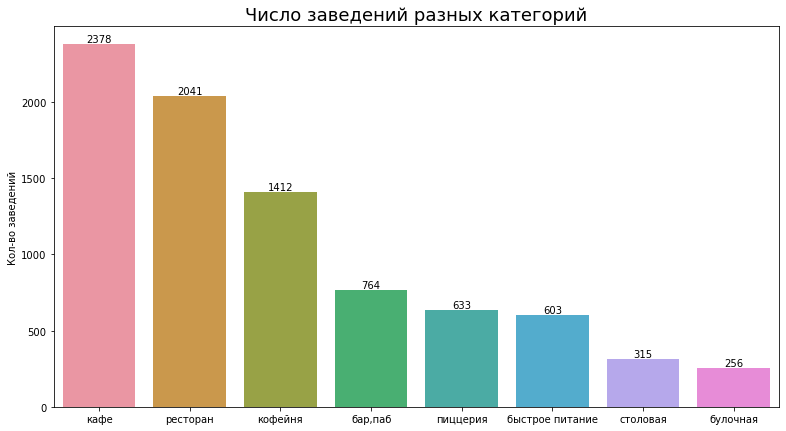

In [42]:
# построим график

plt.figure(figsize=(13,7))
sns.set_palette('coolwarm')
ax = sns.barplot(x='category', y='count', data=df_category)
plt.title('Число заведений разных категорий', fontsize=18)
plt.xlabel('')
plt.ylabel('Кол-во заведений')
plt.bar_label(ax.containers[0])
plt.show()


- Больше всего в Москве кафе - 28% от общего числа заведений;
- На втором месте рестораны - 24%;
- На третьем месте кофейни - 16%.


Исследуем количество посадочных мест в местах по категориям. Проанализируем результаты.

In [43]:
# создадим датасет медианных значений числа мест по разным категориям заведений

df_seats = df[df['seats'] > 0].groupby('category').agg({'seats':'median'}).sort_values('seats', ascending=False).reset_index()
df_seats = df_seats.rename(columns={'seats':'median_seats'})
df_seats

,category,median_seats
0,ресторан,90.0
1,"бар,паб",84.0
2,кофейня,80.0
3,столовая,80.0
4,быстрое питание,75.0
5,кафе,60.0
6,пиццерия,56.0
7,булочная,52.0


In [44]:
# строим столбчатую диаграмму 

fig = px.bar(df_seats, 
             x='median_seats',
             y='category', 
             color ='category',
             color_discrete_sequence= px.colors.sequential.Plasma_r,
             text='median_seats',
             width=800, height=500
            )

fig.update_layout(title='Медиана числа мест по разным категориям заведений',
                   xaxis_title='Медиана числа мест',
                   yaxis_title='',
                   showlegend=False)
fig.show() 

- В среднем ресторане Москвы - 90 мест;
- В баре, пабе - 84;
- В кофейне - 80.


### Сравнение сетевых и несетевых заведений

Рассмотрим соотношение сетевых и несетевых заведений в датасете.

In [45]:
df_chain = df.groupby('chain').agg({'chain':'count'})
df_chain = df_chain.rename(columns={'chain':'count'})
df_chain = df_chain.reset_index() 

# переименуем 0 и 1 в "Несетевые" и "Сетевые"

df_chain.loc[df_chain['chain'] == 0, 'chain'] = 'Несетевые'
df_chain.loc[df_chain['chain'] == 1, 'chain'] = 'Сетевые'

# добавим столбец с долей заведений
df_chain['share,%'] = round(df_chain['count'] / df_chain['count'].sum() *100,2)
df_chain


,chain,count,"share,%"
0,Несетевые,5198,61.87
1,Сетевые,3204,38.13


In [46]:
# построим столбчатую диаграмму 

fig = px.bar(df_chain, 
             x='chain',
             y='count',
             text='count',
             width=700, height=400
            )

fig.update_layout(title='Соотношение сетевых и несетевых заведений в датасете',
                   xaxis_title='Число заведений',
                   yaxis_title='',
                   showlegend=False)
fig.show() 

- 62% заведений нашего датасета - несетевые;
- 38% - представляют сети.

Посмотрим, какие категории заведений чаще являются сетевыми.

In [47]:
# создадим датасет, сгруппировав категории заведений по их принадлежности к сетевой структуре

df_chain_category = df.pivot_table(index=['category','chain'], values='name', aggfunc='count').reset_index()

df_chain_category.loc[df_chain_category['chain'] == 0, 'chain'] = 'Несетевые'
df_chain_category.loc[df_chain_category['chain'] == 1, 'chain'] = 'Cетевые'
df_chain_category

,category,chain,name
0,"бар,паб",Несетевые,595
1,"бар,паб",Cетевые,169
2,булочная,Несетевые,99
3,булочная,Cетевые,157
4,быстрое питание,Несетевые,371
5,быстрое питание,Cетевые,232
6,кафе,Несетевые,1599
7,кафе,Cетевые,779
8,кофейня,Несетевые,693
9,кофейня,Cетевые,719


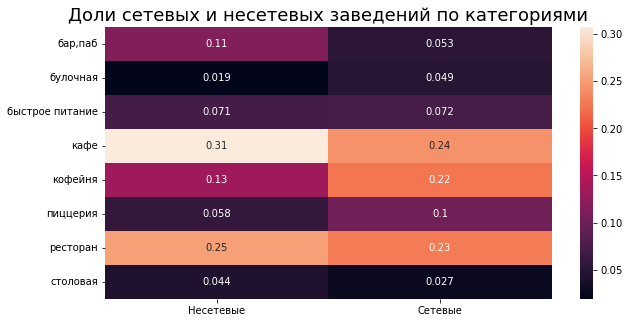

In [48]:
# построим тепловую карту категорий сетевых и несетевых заведений

df_chain_category_new = df.pivot_table(index=['category'], columns=['chain'], values='name', aggfunc='count')
df_chain_category_new = df_chain_category_new.div(df_chain_category_new.sum())
df_chain_category_new.columns = ['Несетевые','Сетевые']


plt.figure(figsize=(10,5))
sns.heatmap(df_chain_category_new, annot=True)
plt.title('Доли сетевых и несетевых заведений по категориями', fontsize=18)
plt.xlabel('')
plt.ylabel('')
plt.show()

- Больше всего сетевых заведений работают в категориях кофеен, кафе и ресторанов.
- Меньше всего - в категориях столовых и булочных.

- Несетевые заведения чаще всего встречаются в категориях ресторанов. 

### Топ-15 сетей общественного питания Москвы

In [49]:
# посчитаем число сетевых заведений и выведем на экран топ-15 

df_pop_chains = df[df['chain'] == 1].groupby('name').agg({'category':'first','name':'count'})
df_pop_chains.columns =['category','count']
df_pop_chains = df_pop_chains.sort_values('count', ascending=False).reset_index().head(15)
df_pop_chains

,name,category,count
0,Шоколадница,кофейня,119
1,Домино'с Пицца,пиццерия,76
2,Додо Пицца,пиццерия,74
3,One Price Coffee,кофейня,71
4,Яндекс Лавка,ресторан,69
5,Cofix,кофейня,65
6,Prime,ресторан,50
7,Хинкальная,быстрое питание,44
8,КОФЕПОРТ,кофейня,42
9,Кулинарная лавка братьев Караваевых,кафе,39


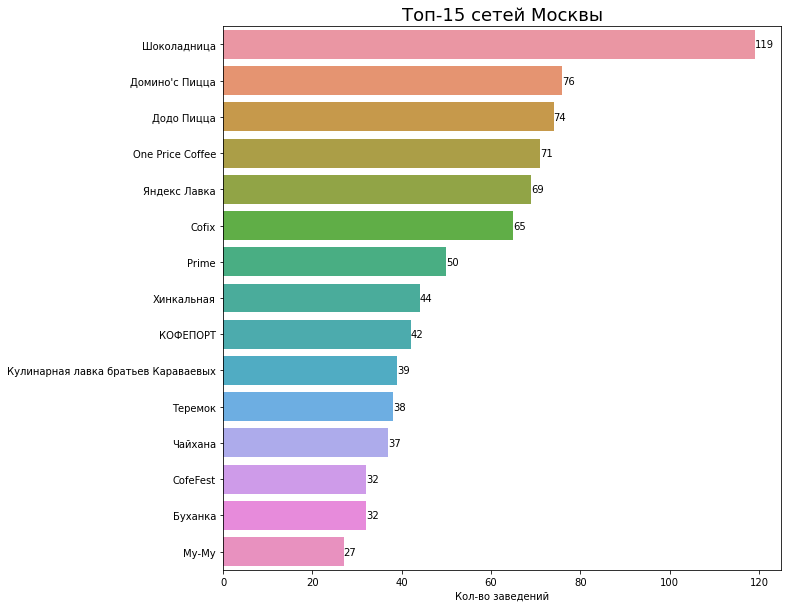

In [50]:
# посмтроим столбчатую диаграмму топ-15 сетей Москвы

plt.figure(figsize=(10,10))
ax = sns.barplot(x='count', y='name', data=df_pop_chains)
plt.title('Топ-15 сетей Москвы', fontsize=18)
plt.xlabel('Кол-во заведений')
plt.ylabel('')
plt.bar_label(ax.containers[0])
plt.show()

- Самая популярная сеть общественного питания Москвы - "Шоколадница"; 
- На втором месте - "Домино'с Пицца";
- На третьем по популярности - "Додо Пицца".

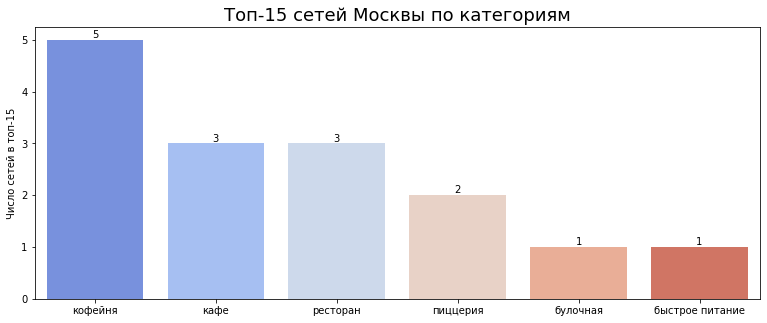

In [51]:
# построим диаграмму топ-15 сетей Москвы по категориям

df_pop_chains_cat = df_pop_chains.groupby('category').agg({'count':'count'}).reset_index().sort_values('count', ascending=False)

plt.figure(figsize=(13,5))
ax = sns.barplot(x='category', y='count', data=df_pop_chains_cat)
plt.title('Топ-15 сетей Москвы по категориям', fontsize=18)
plt.xlabel('')
plt.ylabel('Число сетей в топ-15')
plt.bar_label(ax.containers[0])
plt.show()


In [53]:
px.bar(
    df_pop_chains,
    x='name',
    y='count',
    color='category',
)

- В топ-15 сетей больше всего кофеен;
- На втором месте кафе;
- На третьем - рестораны.


### Исследование административных округов Москвы

In [54]:
# рассчитаем общее число заведений по округам

df_district_count = df.groupby('district').agg({'name':'count'}).sort_values('name', ascending=False).reset_index()

df_district_count.columns=['district', 'count']

df_district_count

,district,count
0,Центральный административный округ,2242
1,Северный административный округ,899
2,Северо-Восточный административный округ,891
3,Южный административный округ,891
4,Западный административный округ,851
5,Восточный административный округ,796
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
8,Северо-Западный административный округ,409


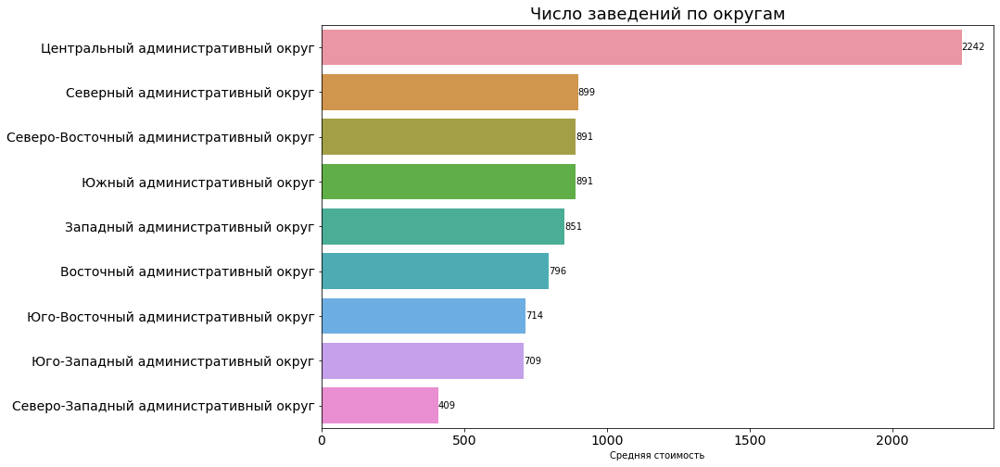

In [55]:
# построим диаграмму числа заведений по округам

plt.figure(figsize=(13,8))
ax = sns.barplot(x='count', y='district', data=df_district_count)
plt.xlabel('Средняя стоимость')
plt.ylabel('')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.title('Число заведений по округам', fontsize=18)
plt.bar_label(ax.containers[0])
plt.show(ax)

- Больше всего точек общепита представлено в ЦАО (2242 точки). Центральный округ лидирует с большим отрывом.
- На втором месте САО (899 точки).
- Второе и третье место делят СВАО и ЮАО с показателем в 891 точку.
- Меньше всего точек общественного питания в СЗАО (409 точки).

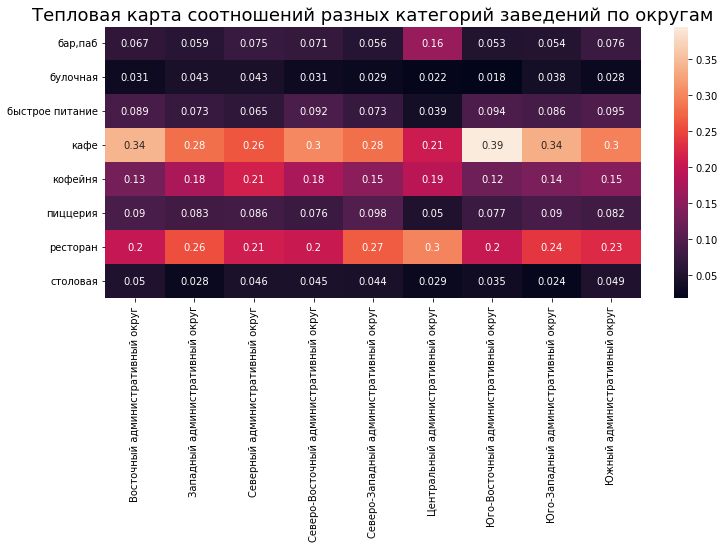

In [56]:
# сформируем таблицу категорий заведений по округам

df_district = df.pivot_table(index='category', columns='district', values='name', aggfunc='count')
df_district = df_district.div(df_district.sum())

# выведем тепловую карту

plt.figure(figsize=(12,5))
sns.heatmap(df_district, annot=True)
plt.title('Тепловая карта соотношений разных категорий заведений по округам', fontsize=18)
plt.xlabel('')
plt.ylabel('')
plt.show()

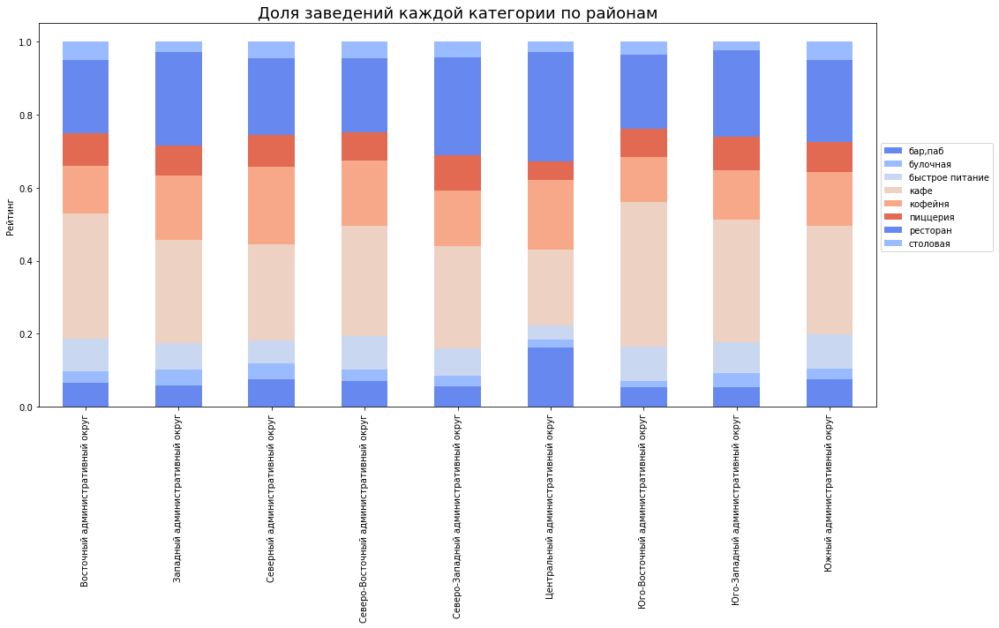

In [57]:
# построим столбчатую диаграмму

df_district.T.plot(stacked=True, kind='bar', figsize=(17,8))
plt.xticks(rotation = 90)
plt.title('Доля заведений каждой категории по районам', fontsize=18)
plt.legend(bbox_to_anchor=(1, 0.7))
plt.xlabel('')
plt.ylabel('Рейтинг')
plt.show()

- Больше всего заведений общественного питания работает в Центральном округе. Больше всего там  представлено ресторанов - 29%. На втором и третьем местах, почти с одинаковым результатом, идут кафе и кофейни - 20,6% и 19% соответственно;
- Меньше всего во всех округах булочных и столовых;
- Кофеен больше всего в Северном округе (21%), меньше всего в Юго-Восточном округе (12%).




### Рейтинги заведений

Изучим распределение средних рейтингов по категориям заведений.

In [58]:
#сгруппируем рейтинг заведений по категориям

df_rating = df.groupby('category').agg({'rating':'mean'}).sort_values('rating', ascending=False)
df_rating.reset_index(inplace=True)
df_rating['rating'] = round(df_rating['rating'],2)
df_rating

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


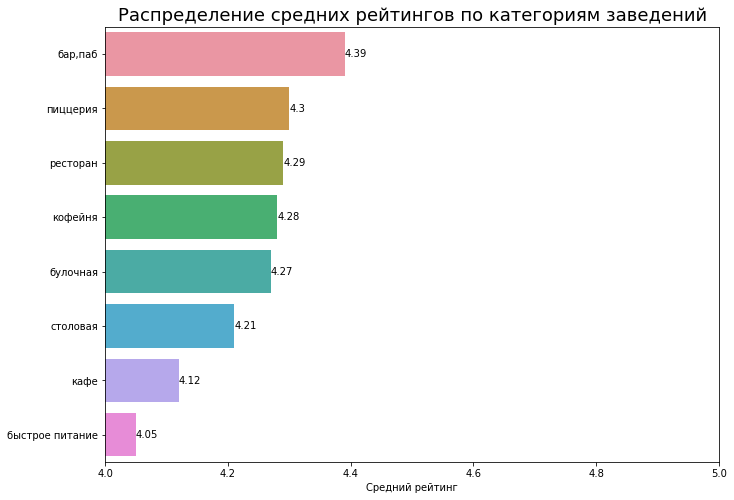

In [59]:
# построим диаграмму средних рейтингов по категориям

plt.figure(figsize=(11,8))
ax = sns.barplot(x='rating', y='category', data=df_rating)
plt.xlabel('Средний рейтинг')
plt.xlim(4,5)
plt.ylabel('')
plt.title('Распределение средних рейтингов по категориям заведений', fontsize=18)
plt.bar_label(ax.containers[0])
plt.show()

- Лучшая средняя оценка рейтинга у баров\пабов - 4.38.
- Чуть хуже оценка у пиццерий - 4.3
- На третьем месте рестораны со средней оценкой 4.29.
- Хуже всего оцениваются заведения быстрого питания. Их средняя оценка - 4.05.
- В целом все категории имеют среднюю оценку не ниже 4-х.

In [60]:
#сгруппируем рейтинг заведений по округам

df_rating_dist = df.groupby('district').agg({'rating':'mean'}).sort_values('rating', ascending=False)
df_rating_dist.reset_index(inplace=True)
df_rating_dist

,district,rating
0,Центральный административный округ,4.377520
1,Северный административный округ,4.239600
2,Северо-Западный административный округ,4.208802
3,Южный административный округ,4.184512
4,Западный административный округ,4.181551
5,Восточный административный округ,4.174246
6,Юго-Западный административный округ,4.172920
7,Северо-Восточный административный округ,4.148260
8,Юго-Восточный административный округ,4.101120


Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района:

In [61]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'C:\\Users\\User\\Desktop\\Python\\admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=df_rating_dist,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.7,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

- Хуже всего с рейтингом обстоят дела в Юго-Восточном административном округе. Средний рейтинг его заведений - 4.10.
- Лучше всех оцениваются заведения Центрального округа. Их средний рейтинг - 4.37.

Отобразим все заведения датасета на карте:

In [62]:
# импортируем маркер
from folium import Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

### Анализ местоположения

Найдем топ-15 улиц по количеству заведений.

In [63]:
# найдем и выведем на экран топ-15 улиц по количеству заведений

df_streets = df.groupby('street').agg({'name':'count'}).sort_values('name', ascending=False).head(15)
df_streets.columns = ['total_count']
df_streets

,total_count
street,
проспект Мира,184
Профсоюзная улица,122
проспект Вернадского,108
Ленинский проспект,107
Ленинградский проспект,95
Дмитровское шоссе,87
Варшавское шоссе,76
Каширское шоссе,76
Ленинградское шоссе,70


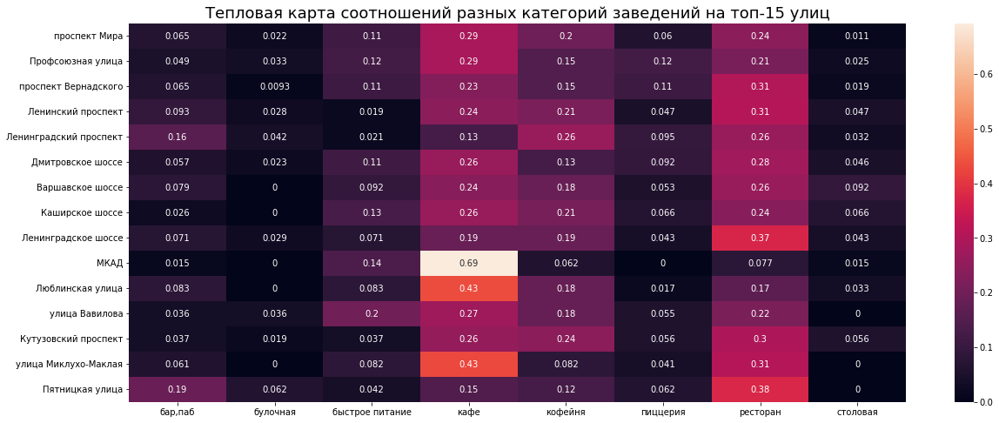

In [64]:
# рассчитаем долю заведений для каждой категории топ-15 улиц

df_str = df.pivot_table(index=['street'], columns='category', values='name', aggfunc='count')
df_str = df_str.join(df_streets).sort_values('total_count', ascending=False).head(15)
df_str = df_str.div(
    df_str['total_count'], axis=0
).drop(columns='total_count')

# заменим пропуски на 0
df_str.fillna(0, inplace=True)


# выведем тепловую карту

plt.figure(figsize=(20,8))
sns.heatmap(df_str, annot=True)
plt.title('Тепловая карта соотношений разных категорий заведений на топ-15 улиц', fontsize=18)
plt.xlabel('')
plt.ylabel('')
plt.show()



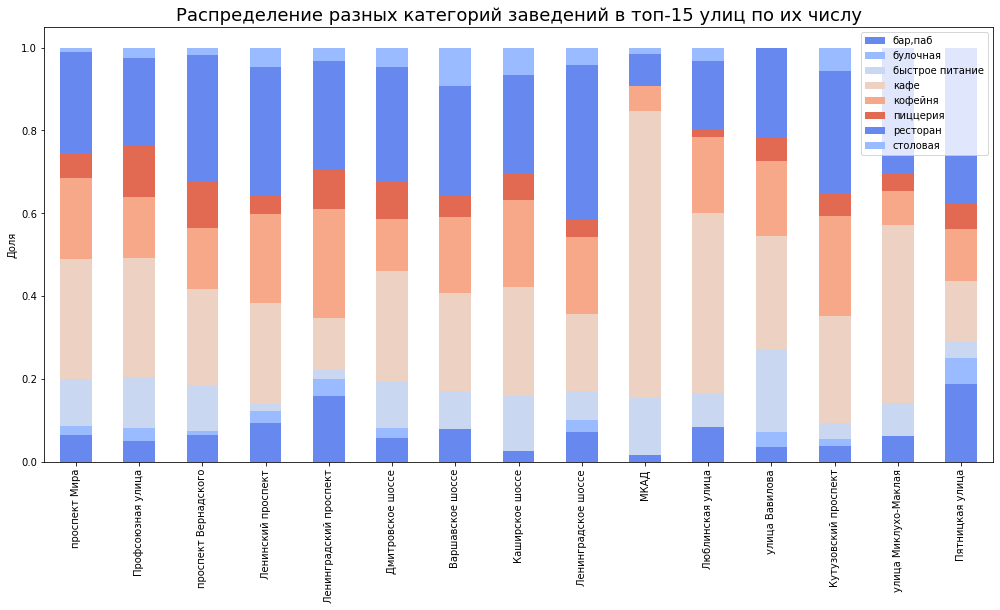

In [65]:
# соствавим график долей разных категорий заведений топ-15 улиц

df_str.plot(stacked=True, kind='bar',figsize=(17,8))
plt.title('Распределение разных категорий заведений в топ-15 улиц по их числу', fontsize=18)
plt.xlabel('')
plt.ylabel('Доля')
plt.show()


- Больше всего на топ-15 улиц располагается кафе и ресторанов.
- Выделяется МКАД, на котором 69% от всех точек общепита - это кафе.
- Наибольшая доля кофеен на Ленинградском проспекте (26%). Наименьшая - на МКАДЕ и улице Миклухо-Маклая. 

Найдем улицы, на которых находится только один объект общепита.

In [66]:
df_str_min = df.groupby('street').agg({
    'name':'count', 
    'lat':'first',
    'lng':'first', 
    'category':'first', 
    'district':'first', 
    'price':'first', 
    'rating':'mean'
}).sort_values('name').reset_index()


df_str_min.columns = ['street','count', 'lat', 'lng','category', 'district','price','rating']

df_str_min = df_str_min[df_str_min['count'] == 1]

df_str_min


,street,count,lat,lng,category,district,price,rating
0,1-й Автозаводский проезд,1,55.704847,37.657065,кафе,Южный административный округ,средние,4.2
1,Одинцовская улица,1,55.790620,37.405720,столовая,Северо-Западный административный округ,категория не указана,4.5
2,Октябрьский переулок,1,55.787258,37.612063,ресторан,Северо-Восточный административный округ,средние,4.1
3,Ордынский тупик,1,55.741026,37.623384,кофейня,Центральный административный округ,категория не указана,4.5
4,Оренбургская улица,1,55.712535,37.862657,кафе,Восточный административный округ,категория не указана,3.0
...,...,...,...,...,...,...,...,...
453,3-й Хорошёвский проезд,1,55.773553,37.535854,столовая,Северный административный округ,средние,4.2
454,Бобров переулок,1,55.764983,37.634254,кафе,Центральный административный округ,средние,4.4
455,Богословский переулок,1,55.762591,37.599530,кофейня,Центральный административный округ,средние,4.6
456,4-й Лесной переулок,1,55.778956,37.587358,ресторан,Центральный административный округ,низкие,4.2


In [67]:
# посмотрим на карте, где располагаются улицы, на которых находится только один объект общепита.

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

def create_marker(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['category']} {row['rating']}"
    ).add_to(m)

df_str_min.apply(create_marker, axis=1)
    
m

In [68]:
df_str_min_cat = df_str_min.groupby('category').agg({'count':'count'}).sort_values('count', ascending=False).reset_index()

df_str_min_cat['share,%'] = round(df_str_min_cat['count'] / df_str_min_cat['count'].sum() *100,2)

df_str_min_cat

,category,count,"share,%"
0,кафе,160,34.93
1,ресторан,93,20.31
2,кофейня,84,18.34
3,"бар,паб",39,8.52
4,столовая,36,7.86
5,быстрое питание,23,5.02
6,пиццерия,15,3.28
7,булочная,8,1.75


- Улицы, на которых работает только одно заведение - короткие. Например, переулки и проезды;
- Больше всего на таких улицах  - заведений категории кафе (35%);
- На втором месте рестораны (20%), на третьем - кофейни (18%)

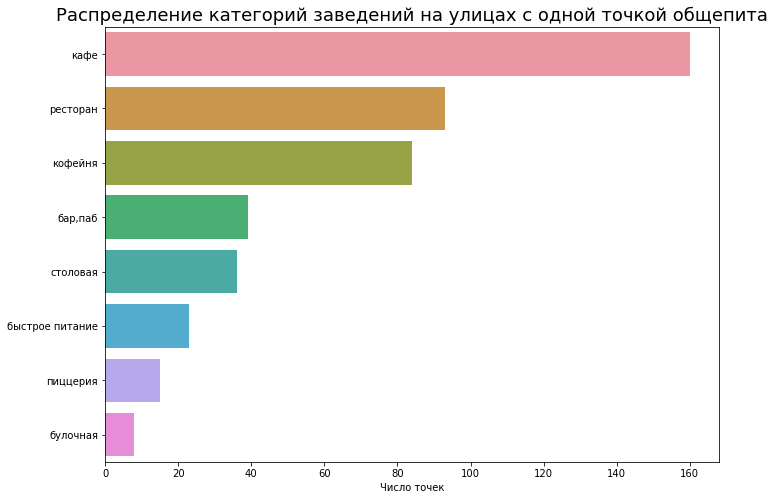

In [69]:
# построим диаграмму 

plt.figure(figsize=(11,8))
sns.barplot(x='count', y='category', data=df_str_min_cat)
plt.xlabel('Число точек')
plt.ylabel('')
plt.title('Распределение категорий заведений на улицах с одной точкой общепита', fontsize=18)
plt.show()

### Средний чек

Посчитаем медиану среднего чека для каждого округа.



In [70]:
df_bill_district = df[df['middle_avg_bill'] > 0].groupby('district').agg({'middle_avg_bill':'median'}).sort_values('middle_avg_bill', ascending=False).reset_index()
df_bill_district

,district,middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,550.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


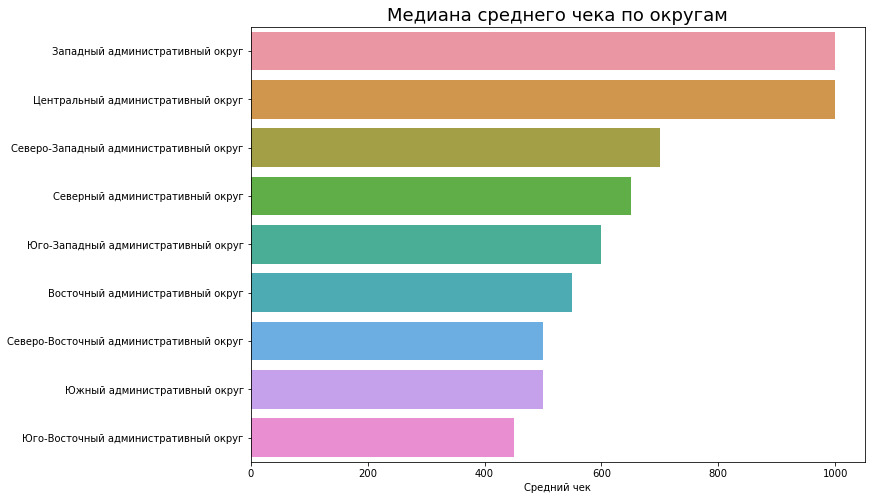

In [71]:
# построим диаграмму средних чеков по округам

plt.figure(figsize=(11,8))
sns.barplot(x='middle_avg_bill', y='district', data=df_bill_district)
plt.xlabel('Средний чек')
plt.ylabel('')
plt.title('Медиана среднего чека по округам', fontsize=18)
plt.show()

Нанесем на фоновую картограмму (хороплет) полученные значения для каждого района.

In [72]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=df_bill_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.7,
    legend_name='Средний чек заведений по округам',
).add_to(m)

m

- Самый высокий медианный чек - в Западном и Центральном округах (1000 рублей).
- Самый низкий - в Юго-Восточном округе (450 рублей).

Вывод:

- Больше всего в Москве кафе - 28% от общего числа заведений, на втором месте рестораны - 24%, на третьем - кофейни - 16%. В среднем ресторане Москвы - 90 мест. В баре, пабе - 84. В кофейне - 80.


- 62% заведений нашего датасета - несетевые. 38% точек общепита представляют сети.


- Больше всего сетевых заведений представлено в категориях кофеен, кафе и ресторанов. Меньше всего - в категории столовых и булочных. Несетевые заведения чаще всего встречаются в категориях ресторанов.


- Самая популярная сеть общественного питания Москвы - "Шоколадница", на втором месте - "Домино'с Пицца", на третьем по популярности - "Додо Пицца".


- В топ-15 сетей больше всего кофеен, на втором месте кафе, на третьем - рестораны.


- Больше всего точек общепита представлено в ЦАО (2242 точки). Центральный округ лидирует с большим отрывом. На втором месте САО (899 точки). Второе и третье место делят СВАО и ЮАО с показателем в 891 точку. Меньше всего точек общественного питания в СЗАО (409 точки).


- В ЦАО больше всего предсталено ресторанов - 29%. На втором и третьем местах, почти с одинаковым результатом, идут кафе и кофейни - 20,6% и 19% соответственно. Меньше всего во всех округах булочных и столовых. Кофеен больше всего в Северном округе (21%), меньше всего в Юго-Восточном округе (12%).


- Лучшая средняя оценка рейтинга у баров\пабов - 4.38. Чуть хуже оценка у пиццерий - 4.3.На третьем месте рестораны со средней оценкой 4.29. Хуже всего оцениваются заведения быстрого питания. Их средняя оценка - 4.05. В целом все категории имеют среднюю оценку не ниже 4-х.


- Хуже всего рейтинги в Юго-Восточном административном округе. Средний рейтинг его заведений - 4.10. Лучше всех оцениваются заведения Центрального округа, их средний рейтинг - 4.37.


- Больше всего на топ-15 улиц располагается кафе и ресторанов. Выделяется МКАД, на котором 69% от всех точек общепита - это кафе. Наибольшая доля кофеен на Ленинградском проспекте (26%). Наименьшая - на МКАДЕ и улице Миклухо-Маклая.


- Улицы, на которых работает только одно заведение - короткие. Например, переулки и проезды. Больше всего на таких улицах работает заведений категории кафе (35%). На втором месте рестораны (20%), на третьем - кофейни (18%).


- Самый высокий медианный чек - в Западном и Центральном округах (1000 рублей). Самый низкий - в Юго-Восточном округе (450 рублей).


## Анализ рынка кофеен Москвы

In [73]:
# создадим датасет, состоящий только из кофеен

df_coffee = df[df['category'] == 'кофейня']

In [74]:
# рассчитаем число кофеен в датасете

print(f'Всего в датасете {len(df_coffee)} кофейни.')

Всего в датасете 1412 кофейни.


In [75]:
# рассчитаем соотношение сетевых и сетевых кофеен

df_coffee_chain = df_coffee.groupby('chain').agg({'chain':'count'})
df_coffee_chain = df_coffee_chain.rename(columns={'chain':'count'})
df_coffee_chain = df_coffee_chain.reset_index() 

# переименуем 0 и 1 в "Несетевые" и "Сетевые"

df_coffee_chain.loc[df_coffee_chain['chain'] == 0, 'chain'] = 'Несетевые'
df_coffee_chain.loc[df_coffee_chain['chain'] == 1, 'chain'] = 'Сетевые'

# добавим столбец с долей заведений
df_coffee_chain['share,%'] = round(df_coffee_chain['count'] / df_coffee_chain['count'].sum() *100,2)
df_coffee_chain

,chain,count,"share,%"
0,Несетевые,693,49.08
1,Сетевые,719,50.92


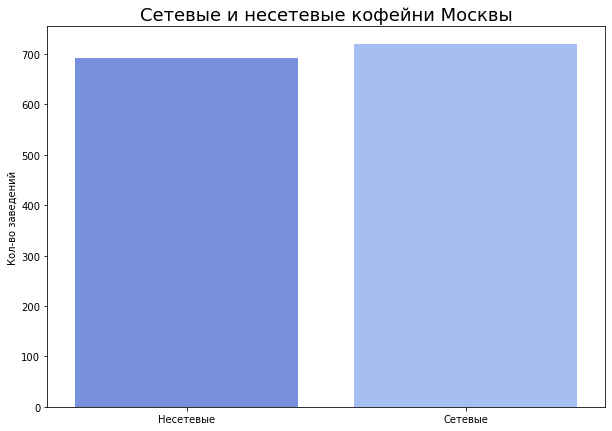

In [76]:
# посмтроим столбчатую диаграмму топ-15 сетей кофеен Москвы

plt.figure(figsize=(10,7))
sns.barplot(x='chain', y='count', data=df_coffee_chain)
plt.title('Сетевые и несетевые кофейни Москвы', fontsize=18)
plt.xlabel('')
plt.ylabel('Кол-во заведений')
plt.show()

Сетевых и несетевых кофеен примерно поровну.

In [77]:
# посчитаем число сетевых кофеен и выведем на экран топ-15 

df_pop_chains_coffee = df_coffee[df_coffee['chain'] == 1].groupby('name').agg({'name':'count'})
df_pop_chains_coffee.columns =['count']
df_pop_chains_coffee  = df_pop_chains_coffee .sort_values('count', ascending=False).reset_index().head(15)
df_pop_chains_coffee 

,name,count
0,Шоколадница,118
1,One Price Coffee,71
2,Cofix,65
3,КОФЕПОРТ,42
4,CofeFest,31
5,Кофемания,22
6,Cinnabon,20
7,Правда кофе,12
8,Krispy Kreme,9
9,Wild Bean Cafe,8


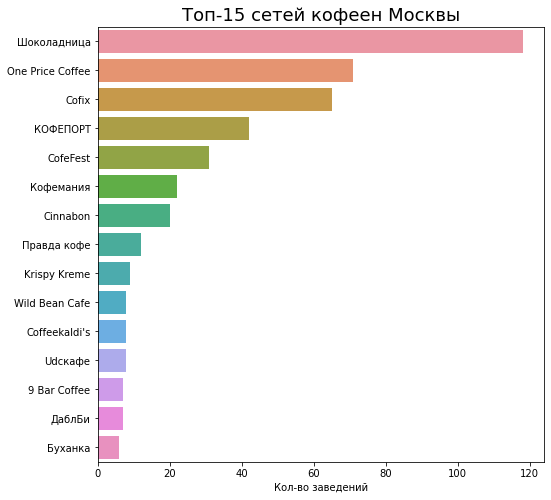

In [78]:
# посмтроим столбчатую диаграмму топ-15 сетей кофеен Москвы

plt.figure(figsize=(8,8))
sns.barplot(x='count', y='name', data=df_pop_chains_coffee)
plt.title('Топ-15 сетей кофеен Москвы', fontsize=18)
plt.xlabel('Кол-во заведений')
plt.ylabel('')
plt.show()

In [79]:
# посмотрим наличие круглосуточных кофеен в датасете

df_coffee.loc[df_coffee['is_24/7'] == 1, 'is_24/7'] = 'Круглосуточные'
df_coffee.loc[df_coffee['is_24/7'] == 0, 'is_24/7'] = 'Негруглосуточные'


df_coffee_24 = df_coffee.groupby('is_24/7').agg({'name':'count'})


df_coffee_24

C:\Users\User\AppData\Local\Temp\ipykernel_5152\3242549487.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,name
is_24/7,
Круглосуточные,59
Негруглосуточные,1353


Круглосуточных кофеен в датасете всего 59. Некруглосуточных - 1353.

- Самая распространенная сеть кофеен Москвы - "Шоколадница" (118 точек). Далее идет One Price Coffee (71 точка) и Cofix (65 точек).

- На последних местах 9 Bar Coffee(7 точек), "ДаблБи"(7 точек) и Буханка (6 точек).	 	 

In [80]:
# рассчитаем число кофеен по округам Москвы

df_coffee_district = df_coffee.groupby('district').agg({'name':'count'}).sort_values('name', ascending=False).reset_index()
df_coffee_district.columns = ['district','count']
df_coffee_district 

,district,count
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,104
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


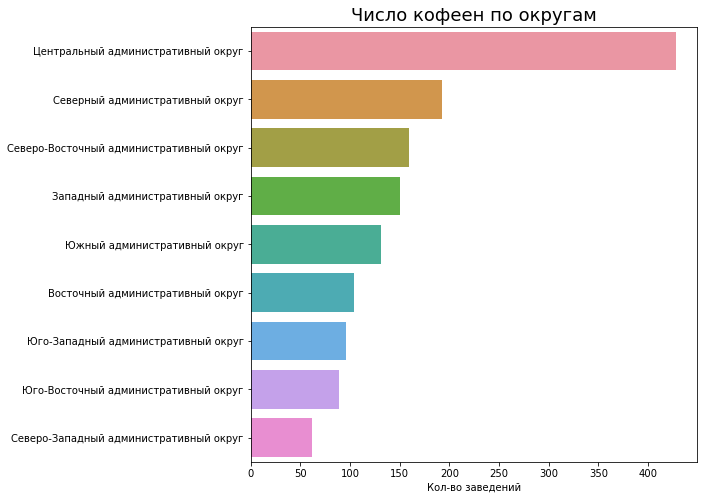

In [81]:
# выведем их на диаграмму

plt.figure(figsize=(8,8))
sns.barplot(x='count', y='district', data=df_coffee_district )
plt.title('Число кофеен по округам', fontsize=18)
plt.xlabel('Кол-во заведений')
plt.ylabel('')
plt.show()

In [82]:
# нанесем данные на карту

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=df_coffee_district,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.7,
    legend_name='Число кофеен по округам',
).add_to(m)


m

- Больше всего кофеен в ЦАО (428)
- Меньше всего - в СЗАО (62).

In [83]:
# посмотрим статистики рейтингов кофеен

df_coffee['rating'].describe()

count    1412.000000
mean        4.277337
std         0.372376
min         1.400000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

In [84]:
# сгруппируем рейтинги кофеен по округам

df_rating_сoffee = df_coffee.groupby('district').agg({'rating':'mean'}).sort_values('rating', ascending=False)
df_rating_сoffee.reset_index(inplace=True)
df_rating_сoffee

,district,rating
0,Центральный административный округ,4.336449
1,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
3,Восточный административный округ,4.283654
4,Юго-Западный административный округ,4.283333
5,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
7,Северо-Восточный административный округ,4.216981
8,Западный административный округ,4.195333


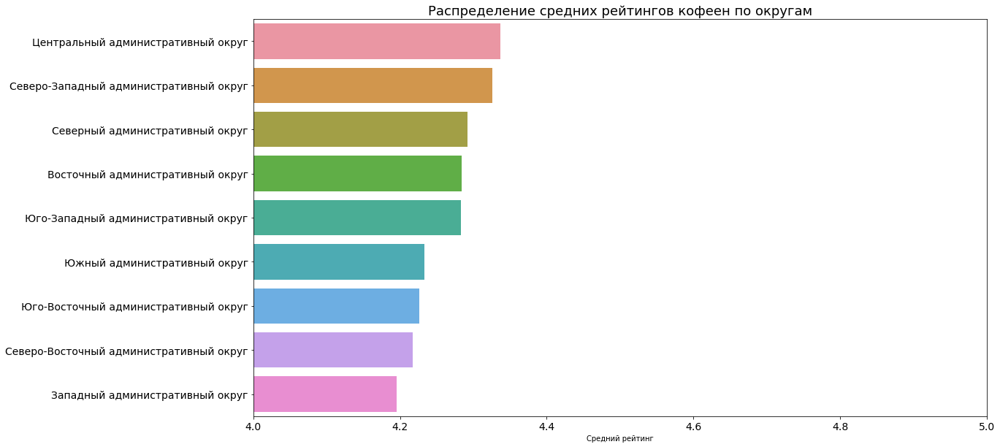

In [85]:
# построим диаграмму средних рейтингов по округам

plt.figure(figsize=(18,10))
sns.barplot(x='rating', y='district', data=df_rating_сoffee)
plt.xlabel('Средний рейтинг')
plt.xlim(4,5)
plt.ylabel('')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.title('Распределение средних рейтингов кофеен по округам', fontsize=18)
plt.show()

In [86]:
# посмотрим распределение по числу посадочных мест в кофейнях Москвы

df_coffee[df_coffee['seats'] > 0]['seats'].describe()


count     726.000000
mean      114.962810
std       128.362783
min         2.000000
25%        40.250000
50%        80.000000
75%       150.000000
max      1288.000000
Name: seats, dtype: float64

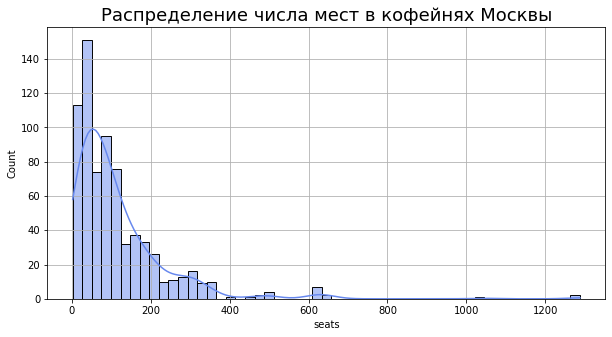

In [87]:
# построим гистограмму числа мест

plt.figure(figsize=(10,5))
sns.set_palette('coolwarm')
sns.histplot(df_coffee[df_coffee['seats'] > 0]['seats'], kde=True)
plt.grid()
plt.title('Распределение числа мест в кофейнях Москвы', fontsize=18)
plt.show()

- Медиана числа мест в московской кофейне - 80. Средний показатель - 114. Такой разброс между медианой и средним объясняется работой многих кофеен на фудкортах торговых центров.


Изучим данные цены на капучино в московских кофейнях.

In [88]:
df_coffee[df_coffee['middle_coffee_cup'] > 0]['middle_coffee_cup'].describe()

count    520.000000
mean     172.376923
std       65.767854
min       60.000000
25%      124.000000
50%      169.500000
75%      225.000000
max      375.000000
Name: middle_coffee_cup, dtype: float64

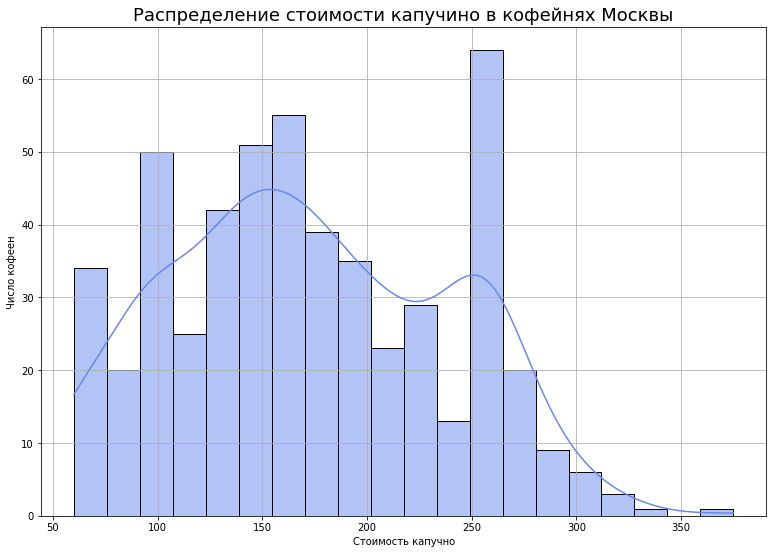

In [89]:
plt.figure(figsize=(13,9))
sns.set_palette('coolwarm')
sns.histplot(df_coffee[df_coffee['middle_coffee_cup'] > 0]['middle_coffee_cup'], kde=True, bins=20)
plt.grid()
plt.xlabel('Стоимость капучно')
plt.ylabel('Число кофеен')
plt.title('Распределение стоимости капучино в кофейнях Москвы', fontsize=18)
plt.show()

In [90]:
# посчитаем медиану среднего чека для разных округов


df_coffee_district = df[df['middle_coffee_cup'] > 0].groupby('district').agg({'middle_coffee_cup':'median'}).sort_values('middle_coffee_cup', ascending=False).reset_index()
df_coffee_district

,district,middle_coffee_cup
0,Юго-Западный административный округ,197.0
1,Центральный административный округ,190.0
2,Западный административный округ,187.0
3,Северо-Восточный административный округ,162.5
4,Северный административный округ,159.0
5,Северо-Западный административный округ,150.0
6,Южный административный округ,149.5
7,Юго-Восточный административный округ,145.0
8,Восточный административный округ,135.0


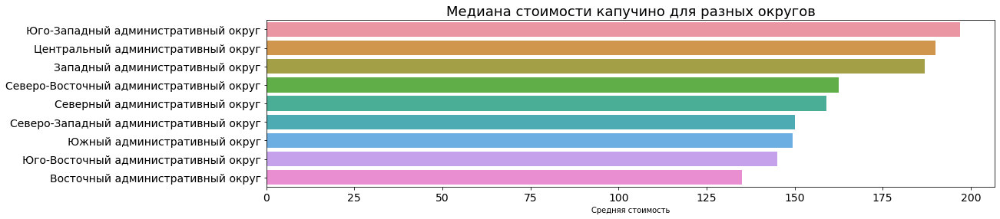

In [91]:
# построим диаграмму среднего чека для разных округов

plt.figure(figsize=(17,4))
sns.barplot(x='middle_coffee_cup', y='district', data=df_coffee_district)
plt.xlabel('Средняя стоимость')
plt.ylabel('')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.title('Медиана стоимости капучино для разных округов', fontsize=18)
plt.show()



- Медианный показатель стоимости капучино в Москве - 169 рубля. Максимальная цена - 375 рублей, минимальная - 60 рублей.

- Распределение цен на капучино имеет два пика: в области значений в 150 и 250 рублей. 

- Самый дорогой капучино - в ЮЗАО - его медиаанная стоимость там составляет 197 рублей. Самый дешевый - в ВАО. Его медианная стоимость не территории этого округа - 135 рублей.

Вывод:

- Всего в датасете 1412 кофейни.
- Большая часть кофеен работает в Центральном округе (462). Меньше всего - в СЗАО (62).
- Средний рейтинг московский кофейни - 4.3. Самый высокий средний рейтинг - у кофеен ЦАО - 4.33. Самый низкий- у кофеен ЗАО - 4.19. Как видим, разброс средних рейтингов по округам небольшой и составляет всего прмерно 0,1 пункта. 
- Медиана числа мест в московской кофейне - 80. Средний показатель - 114. Такой разброс между медианой и средним объясняется работой многих кофеен на фудкортах торговых центров.
- Медианный показатель стоимости капучино в Москве - 169 рубля. Максимальная цена - 375 рублей, минимальная - 60 рублей.
- Распределение цен на капучино имеет два пика: в области значений в 150 и 250 рублей. 
- Подавляющее число кофеен в Москве не работают 24\7.
- Самый дорогой капучино - в ЮЗАО - его медиаанная стоимость там составляет 197 рублей. Самый дешевый - в ВАО. Его медианная стоимость не территории этого округа - 135 рублей.


Рекомендации по открытию новой кофейни: 

- Открытие кофейни в ЦАО гарантирует хороший трафик (правда, судить о котором на основе имеющихся данных мы не можем), однако конкуренция в этом округе очень высока. 
- Меньше всего кофеен в СЗАО, но это может быть вызвано скрытыми для нас третьими факторами, такими как низкий спрос на такие заведения на этой территории. На основе представленных данных сделать вывод о причинах разброса количества кофеен по округам Москвы мы не можем.  
- При открытии кофейни рекомендуется придерживаться медианной цены на кофе - это около 170 рублей.
- Число мест зависит от концепции и бизнес-модели нового заведения. Если придерживаться медианы, то в новой кофейне должно быть около 80 мест.

___

